# Проверка «целостности» машин через Mask2Former

Прогон сегментатора повреждений (**Mask2Former**, дообученный на CarDD) по сгенерированным фото из `car_clear_generated`.

**Ожидание:** большинство машин — **целые**. Те, у кого модель находит повреждения, показываем парами «без сегментации / с сегментацией» (до 10 примеров).

**Шаги:** загрузка модели из W&B → инференс по папке → сводка целые/повреждённые → визуализация примеров.

Критерий «не целая»: найден хотя бы один инстанс с `score >= SCORE_THRESH`.

## 0. Установка и импорты

In [ ]:
!pip install -q "transformers>=4.40" wandb gdown

In [68]:
import os, time
from pathlib import Path
from collections import Counter
import random

import numpy as np
import pandas as pd
import torch
from PIL import Image
import matplotlib.pyplot as plt
from datetime import datetime
import cv2
import logging

from transformers import Mask2FormerForUniversalSegmentation, Mask2FormerImageProcessor

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

CLASS_NAMES = ["dent", "scratch", "crack", "glass_shatter", "lamp_broken", "tire_flat"]
NUM_CLASSES = 6
IMG_SIZE = 512

N_SHOW = 10
MAX_IMAGES = 500


random.seed(2026)

device: cuda


In [5]:
LOG_DIR = Path("logs")
LOG_DIR.mkdir(exist_ok=True)
_log_file = LOG_DIR / f"models_сomparison{datetime.now().strftime('%Y%m%d_%H%M%S')}.log"

formatter = logging.Formatter("%(asctime)s %(levelname)s %(message)s")

log = logging.getLogger("models_сomparison")
log.setLevel(logging.INFO)
log.handlers.clear()

log.addHandler(logging.StreamHandler())
log.addHandler(logging.FileHandler(_log_file, encoding="utf-8"))

for h in log.handlers:
    h.setFormatter(formatter)

log.propagate = False
log.info(f"device: {device} | log: {_log_file}")

2026-06-16 06:00:46,210 INFO device: cuda | log: logs/models_сomparison20260616_060046.log


## Данные: распаковка `car_clear_generated`

In [50]:
# !gdown --fuzzy https://drive.google.com/file/d/1KSxPuDzh35MXCqoavWU742XLdQQVWQjd/view?usp=sharing -O /content/CarDD_COCO.zip
!unzip -q /content/CarDD_COCO.zip -d /content/


In [88]:
DATA_DIR_GERERATED = Path("/content/car_clear_generated")
images_generated = sorted(DATA_DIR_GERERATED.rglob("*.jpg"))
if MAX_IMAGES:
    images_generated = random.sample(images_generated, min(MAX_IMAGES, len(images_generated)))
log.info(f"найдено изображений: {len(images_generated)}")
assert len(images_generated) > 0, "Не найдено .jpg — проверь DATA_DIR"

2026-06-16 08:03:25,157 INFO найдено изображений: 500


In [89]:
DATA_DIR_CLEAR = Path("/content/car_clear_parsed")
images_clear = sorted(DATA_DIR_CLEAR.rglob("*.jpg"))
if MAX_IMAGES and len(images_clear) > MAX_IMAGES:
    images_clear = random.sample(images_clear, min(MAX_IMAGES, len(images_generated)))
log.info(f"найдено изображений: {len(images_clear)}")
assert len(images_clear) > 0, "Не найдено .jpg — проверь DATA_DIR"

2026-06-16 08:03:26,104 INFO найдено изображений: 306


In [90]:
DATA_DIR_DAMAGED = Path("/content/CarDD_COCO/test2017")
images_damaged = sorted(DATA_DIR_DAMAGED.rglob("*.jpg"))
if MAX_IMAGES and len(images_damaged) > MAX_IMAGES:
    images_damaged = random.sample(images_damaged, min(MAX_IMAGES, len(images_damaged)))
log.info(f"найдено изображений: {len(images_damaged)}")
assert len(images_damaged) > 0, "Не найдено .jpg — проверь DATA_DIR"

2026-06-16 08:03:27,277 INFO найдено изображений: 374


## 1. Загрузка Mask2Former из W&B

In [61]:
import wandb
wandb.login()

ENTITY = "maty11-hse"
PROJECT_MASK2FORMER = "test_mask2former"
M2F = {
    "artifact":  f"{ENTITY}/{PROJECT_MASK2FORMER}/mask2former_cardd_epoch7:v0",
    "ckpt_file": "mask2former_cardd_best.pt",
}

api = wandb.Api()
art = api.artifact(M2F["artifact"])
M2F["ckpt_path"] = os.path.join(art.download(), M2F["ckpt_file"])
log.info("ckpt:", M2F["ckpt_path"])

M2F_CHECKPOINT = "facebook/mask2former-swin-tiny-coco-instance"
id2label = {i: n for i, n in enumerate(CLASS_NAMES)}

model = Mask2FormerForUniversalSegmentation.from_pretrained(
    M2F_CHECKPOINT, id2label=id2label,
    label2id={n: i for i, n in id2label.items()},
    ignore_mismatched_sizes=True)

ckpt = torch.load(M2F["ckpt_path"], map_location=device)
model.load_state_dict(ckpt["model"])
model.to(device).eval()

processor = Mask2FormerImageProcessor(
    do_resize=True, size={"height": IMG_SIZE, "width": IMG_SIZE},
    ignore_index=255, do_reduce_labels=True)

vl = ckpt.get("val_loss")
log.info(f"Mask2Former загружен (best epoch {ckpt.get('epoch')}"
      + (f", val_loss {vl:.4f})" if vl is not None else ")"))

wandb: Downloading large artifact 'mask2former_cardd_epoch7:v0', 181.07MB. 1 files...
wandb:   1 of 1 files downloaded.  
Done. 00:00:00.2 (796.3MB/s)
--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.12/logging/__init__.py", line 1160, in emit
    msg = self.format(record)
          ^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/logging/__init__.py", line 999, in format
    return fmt.format(record)
           ^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/logging/__init__.py", line 703, in format
    record.message = record.getMessage()
                     ^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/logging/__init__.py", line 392, in getMessage
    msg = msg % self.args
          ~~~~^~~~~~~~~~~
TypeError: not all arguments converted during string formatting
Call stack:
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/usr/local/lib/python3.12/dist-packages/colab_kernel_launcher.py",

Loading weights:   0%|          | 0/554 [00:00<?, ?it/s]

[transformers] Mask2FormerForUniversalSegmentation LOAD REPORT from: facebook/mask2former-swin-tiny-coco-instance
Key                                                                                                                                | Status     |                                                                                        
-----------------------------------------------------------------------------------------------------------------------------------+------------+----------------------------------------------------------------------------------------
model.pixel_level_module.encoder.swin.encoder.layers.{0, 1, 2, 3}.blocks.{0, 1, 2, 3, 4, 5}.attention.self.relative_position_index | UNEXPECTED |                                                                                        
model.pixel_level_module.encoder.swin.layernorm.bias                                                                               | MISSING    |                                       

## 2. Целые vs не целые

Для каждой картинки берём инстансы Mask2Former с `score >= SCORE_THRESH`. Маски в большом цикле не храним — только сводку; для визуализации заново посчитаем маски у выбранных примеров.

In [80]:
SCORE_GRID  = np.round(np.arange(0.85, 0.95 + 1e-9, 0.02), 2)  # [0.85, ... 0.95]; шаг 0.01 -> 11 значений
BASE_THRESH = float(SCORE_GRID.min())

In [91]:
@torch.no_grad()
def detect_scores(path, base_thresh=BASE_THRESH):
    img = np.array(Image.open(path).convert("RGB"))
    H, W = img.shape[:2]
    enc = processor(images=img, return_tensors="pt")
    out = model(pixel_values=enc["pixel_values"].to(device))
    p = processor.post_process_instance_segmentation(
        out, target_sizes=[(H, W)], threshold=base_thresh, return_binary_maps=True)[0]
    dets = []
    if p["segmentation"] is not None and len(p["segments_info"]) > 0:
        masks = p["segmentation"]
        if masks.dim() == 2: masks = masks[None]
        for k, seg in enumerate(p["segments_info"]):
            if int((masks[k] > 0.5).sum().item()) < MIN_AREA_PX: continue
            dets.append((CLASS_NAMES[seg["label_id"]], float(seg["score"])))
    return dets

DATASETS = {
    "generated": images_generated,
    "parsed":    images_clear,
    "damaged":   images_damaged,
}

records, t0 = [], time.time()
for ds_name, imgs in DATASETS.items():
    for i, path in enumerate(imgs):
        records.append({"dataset": ds_name, "file": path.name, "path": str(path),
                        "dets": detect_scores(path)})
        if (i + 1) % 200 == 0:
            log.info(f"  [{ds_name}] {i+1}/{len(imgs)} ({time.time()-t0:.0f}s)")
log.info(f"инференс готов: {len(records)} фото за {time.time()-t0:.0f}s")

2026-06-16 08:03:56,469 INFO   [generated] 200/500 (25s)
2026-06-16 08:04:21,656 INFO   [generated] 400/500 (50s)
2026-06-16 08:05:02,838 INFO   [parsed] 200/306 (91s)
2026-06-16 08:05:45,598 INFO   [damaged] 200/374 (134s)
2026-06-16 08:06:09,339 INFO инференс готов: 1180 фото за 157s


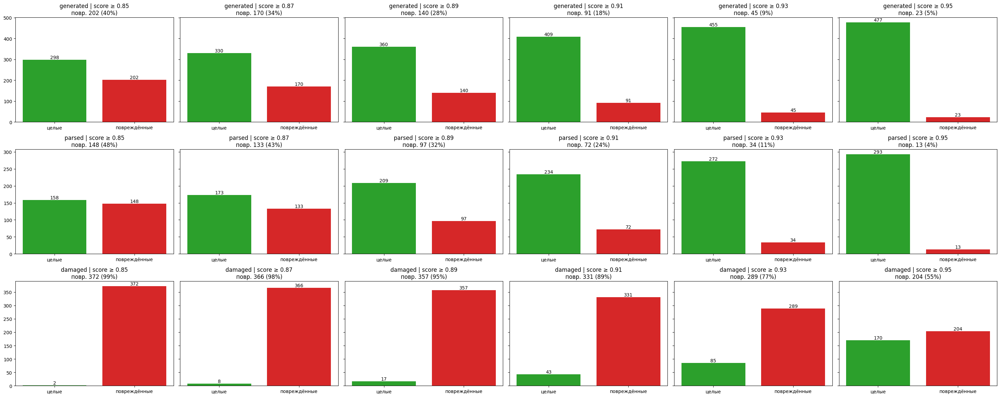

score_thresh,0.85,0.87,0.89,0.91,0.93,0.95
dataset,,,,,,
damaged,99.5,97.9,95.5,88.5,77.3,54.5
generated,40.4,34.0,28.0,18.2,9.0,4.6
parsed,48.4,43.5,31.7,23.5,11.1,4.2


In [92]:
def summarize(records, score_thresh):
    rows = []
    for r in records:
        dets = [(l, s) for l, s in r["dets"] if s >= score_thresh]
        rows.append({"dataset": r["dataset"], "file": r["file"], "path": r["path"],
                     "damaged": len(dets) > 0, "n_defects": len(dets),
                     "max_score": max((s for _, s in dets), default=0.0),
                     "classes": ",".join(sorted({l for l, _ in dets}))})
    return pd.DataFrame(rows)

dfs, sweep = {}, []
ds_names = list(DATASETS.keys())
fig, axes = plt.subplots(len(ds_names), len(SCORE_GRID),
                         figsize=(5 * len(SCORE_GRID), 4 * len(ds_names)),
                         squeeze=False, sharey="row")
for c, t in enumerate(SCORE_GRID):
    d_all = summarize(records, t); dfs[float(t)] = d_all
    for r, ds in enumerate(ds_names):
        d = d_all[d_all["dataset"] == ds]
        n_dmg = int(d["damaged"].sum()); n_ok = len(d) - n_dmg
        ax = axes[r][c]
        ax.bar(["целые", "повреждённые"], [n_ok, n_dmg], color=["tab:green", "tab:red"])
        ax.set_title(f"{ds} | score ≥ {t:.2f}\nповр. {n_dmg} ({100*n_dmg/max(len(d),1):.0f}%)")
        for i, v in enumerate([n_ok, n_dmg]): ax.text(i, v, str(v), ha="center", va="bottom")
        sweep.append({"dataset": ds, "score_thresh": float(t),
                      "целые": n_ok, "повреждённые": n_dmg,
                      "%_повр": round(100 * n_dmg / max(len(d), 1), 1)})
plt.tight_layout(); plt.show()
pd.DataFrame(sweep).pivot(index="dataset", columns="score_thresh", values="%_повр")

Видим, что "размениваем" то, что поломанные машины оцениваются как целые на то, что целые оцениваются как поломанные. Нам нужно выбрать итоговоый порог. Для нас ошибиться лучше в сторону лишнего предсказания (то есть признать целую поломанной и ловить максимум поломанных, то есть нам важнее полнота над точностью)

**Остановимся на пороге 0.87**

### Посмотрим на ложные предсказания при таком пороге

2026-06-16 08:15:48,763 INFO 
===== generated: определены как ПОЛОМАННЫЕ — 10 шт. =====


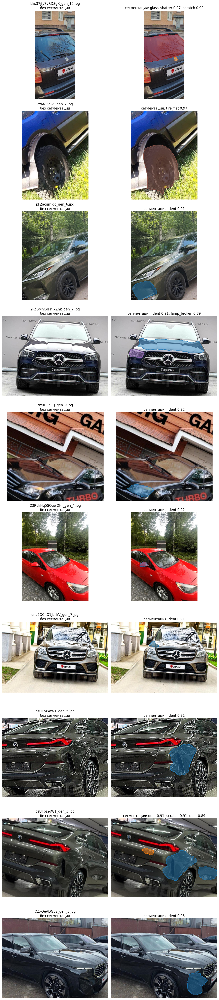

2026-06-16 08:15:53,059 INFO 
===== parsed: определены как ПОЛОМАННЫЕ — 10 шт. =====


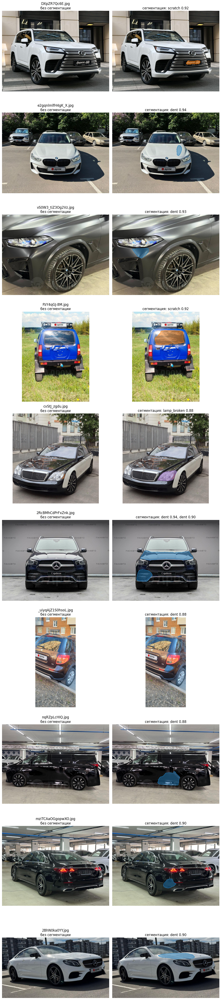

2026-06-16 08:15:59,551 INFO 
===== damaged: определены как ЦЕЛЫЕ — 8 шт. =====


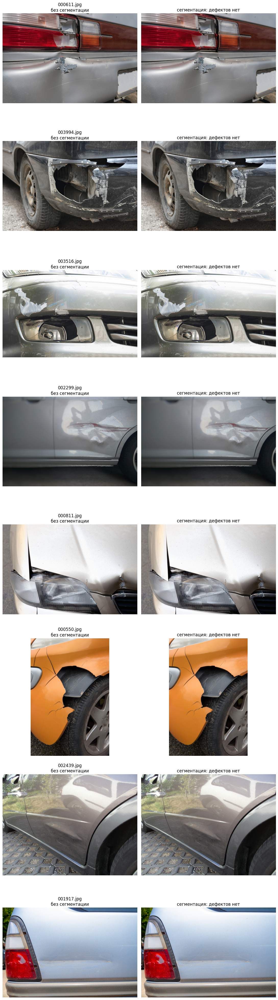

In [93]:
THR = 0.87
SCORE_THRESH = THR
dfT = summarize(records, THR)

TASKS = [
    ("generated", True,  10),
    ("parsed",    True,  10),
    ("damaged",   False, 10),
]

def pick(dataset, want_damaged, n):
    sub = dfT[(dfT["dataset"] == dataset) & (dfT["damaged"] == want_damaged)]
    paths = sub["path"].tolist()
    random.shuffle(paths)
    return paths[:n]

def show_group(dataset, paths, want_damaged):
    kind = "определены как ПОЛОМАННЫЕ" if want_damaged else "определены как ЦЕЛЫЕ"
    log.info(f"\n===== {dataset}: {kind} — {len(paths)} шт. =====")
    if not paths:
        log.info("нет подходящих фото"); return
    fig, axes = plt.subplots(len(paths), 2, figsize=(11, 5 * len(paths)), squeeze=False)
    for r, path in enumerate(paths):
        img, inst = predict_instances(path)
        vis = overlay(img, inst)
        title = ", ".join(f"{d['label']} {d['score']:.2f}"
                          for d in sorted(inst, key=lambda x: -x["score"])) or "дефектов нет"
        axes[r][0].imshow(img); axes[r][0].axis("off")
        axes[r][0].set_title(f"{Path(path).name}\nбез сегментации")
        axes[r][1].imshow(vis); axes[r][1].axis("off")
        axes[r][1].set_title(f"сегментация: {title}")
    plt.tight_layout(); plt.show()

for ds, want, n in TASKS:
    show_group(ds, pick(ds, want, n), want)

Выводы:

модель плохо спраялается с:
- отражениями в стекле
- сложными формами машин
- бликами и засветами

Тем не менее доля ложно-негативный срабатываний на выборке с поломанными машинами в 2% - допустимая ошибка 2-го рода (False Negative)